In [ ]:
pip install itk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 MB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.5/28.5 MB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 64.1 MB/s eta 0:00:00


In [ ]:
pip install SimpleITK

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 MB 12.1 MB/s eta 0:00:00


Saving volume-9.nii to volume-9 (1).nii
Processing: volume-9 (1).nii
Total patches extracted: 33


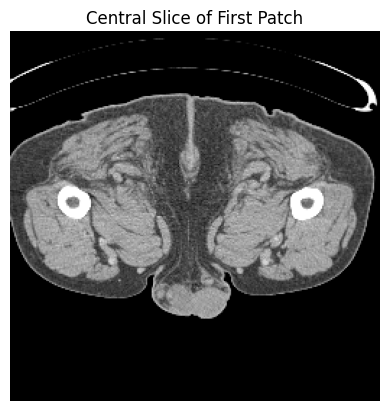

In [9]:
import numpy as np
import SimpleITK as sitk
import matplotlib.pyplot as plt
from google.colab import files
import os

def clamp_and_normalize(image_np):
    image_np = np.clip(image_np, -200, 200)
    image_np = (image_np + 200) / 400.0
    return image_np

def resample_image(itk_img, out_spacing=[1.5, 1.5, 1.0]):
    original_spacing = itk_img.GetSpacing()
    original_size = itk_img.GetSize()

    out_size = [
        int(round(original_size[i] * (original_spacing[i] / out_spacing[i])))
        for i in range(3)
    ]

    resampler = sitk.ResampleImageFilter()
    resampler.SetInterpolator(sitk.sitkLinear)
    resampler.SetOutputSpacing(out_spacing)
    resampler.SetSize(out_size)
    resampler.SetOutputDirection(itk_img.GetDirection())
    resampler.SetOutputOrigin(itk_img.GetOrigin())
    return resampler.Execute(itk_img)

def center_crop_or_pad(volume, target_shape=(256, 256)):
    z, y, x = volume.shape
    padded = np.zeros((z, target_shape[0], target_shape[1]), dtype=volume.dtype)

    crop_y = min(y, target_shape[0])
    crop_x = min(x, target_shape[1])
    y_start = (y - crop_y) // 2
    x_start = (x - crop_x) // 2
    y_end = y_start + crop_y
    x_end = x_start + crop_x

    padded_y_start = (target_shape[0] - crop_y) // 2
    padded_x_start = (target_shape[1] - crop_x) // 2

    padded[:, padded_y_start:padded_y_start + crop_y, padded_x_start:padded_x_start + crop_x] = \
        volume[:, y_start:y_end, x_start:x_end]

    return padded

def split_into_patches(volume, patch_depth=32, stride=16):
    z, h, w = volume.shape
    patches = []
    for start in range(0, z - patch_depth + 1, stride):
        patch = volume[start:start+patch_depth]
        patches.append(patch)
    return np.stack(patches, axis=0) if patches else np.expand_dims(volume[:patch_depth], axis=0)

def process_one_image(filepath):
    print(f"Processing: {filepath}")
    itk_img = sitk.ReadImage(filepath)
    img_resampled = resample_image(itk_img)
    img_np = sitk.GetArrayFromImage(img_resampled)  # [Z, Y, X]

    img_np = clamp_and_normalize(img_np)
    img_np = center_crop_or_pad(img_np)
    patches = split_into_patches(img_np)

    print(f"Total patches extracted: {len(patches)}")
    return patches

# === File Upload ===
uploaded = files.upload()
for fname in uploaded.keys():
    if fname.endswith('.nii') or fname.endswith('.nii.gz'):
        patches = process_one_image(fname)

        # Display the central slice of the first patch
        plt.imshow(patches[0][16], cmap='gray')
        plt.title("Central Slice of First Patch")
        plt.axis('off')
        plt.show()


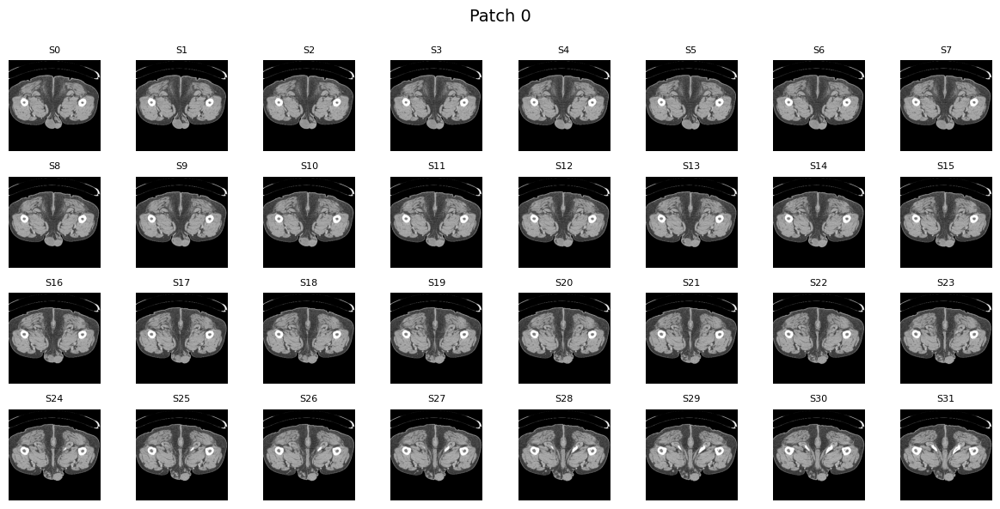

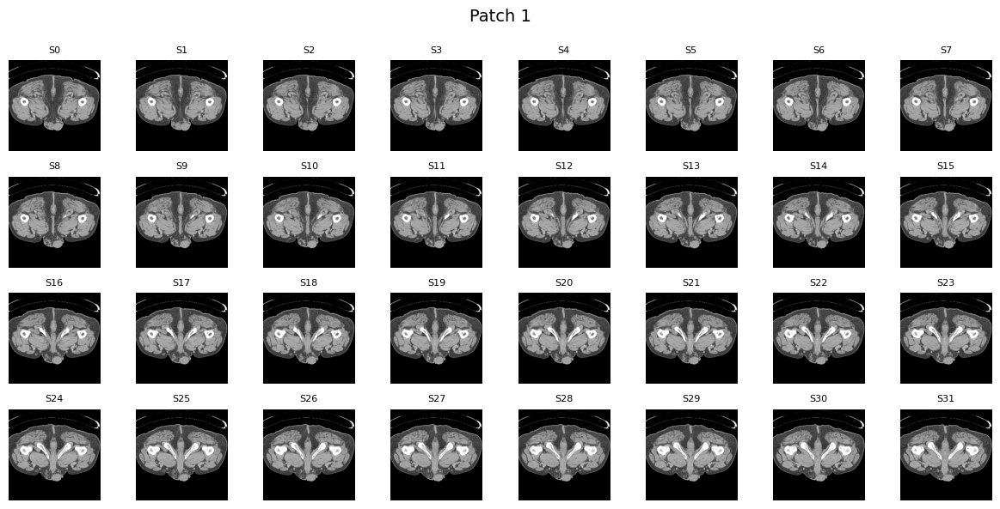

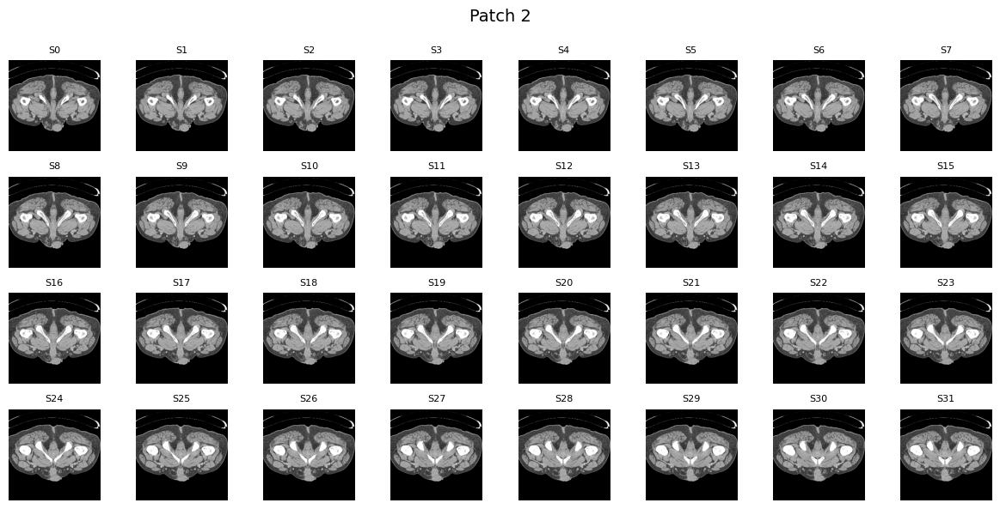

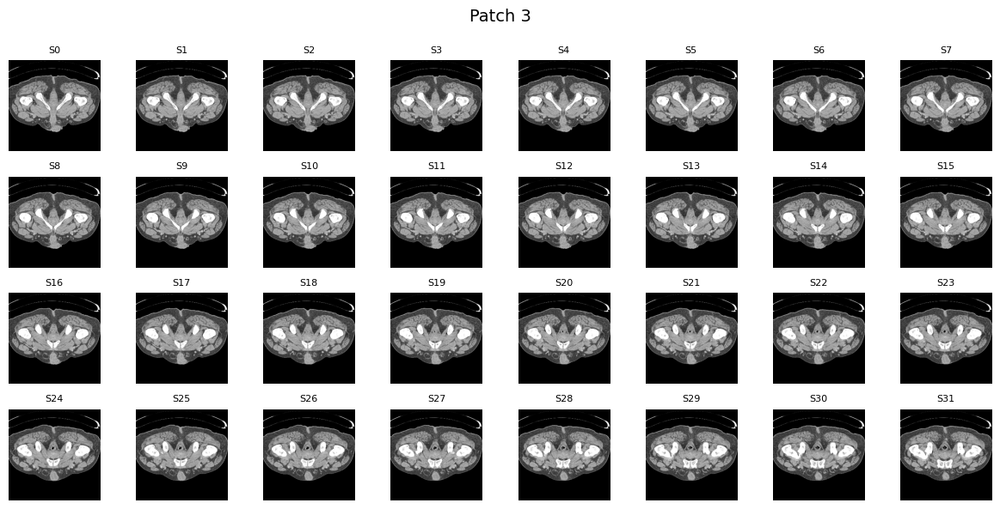

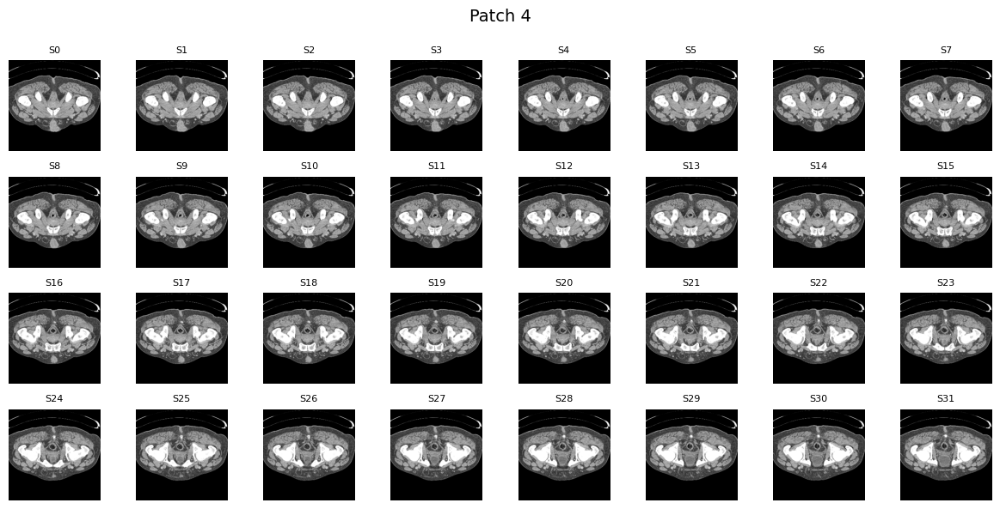

...

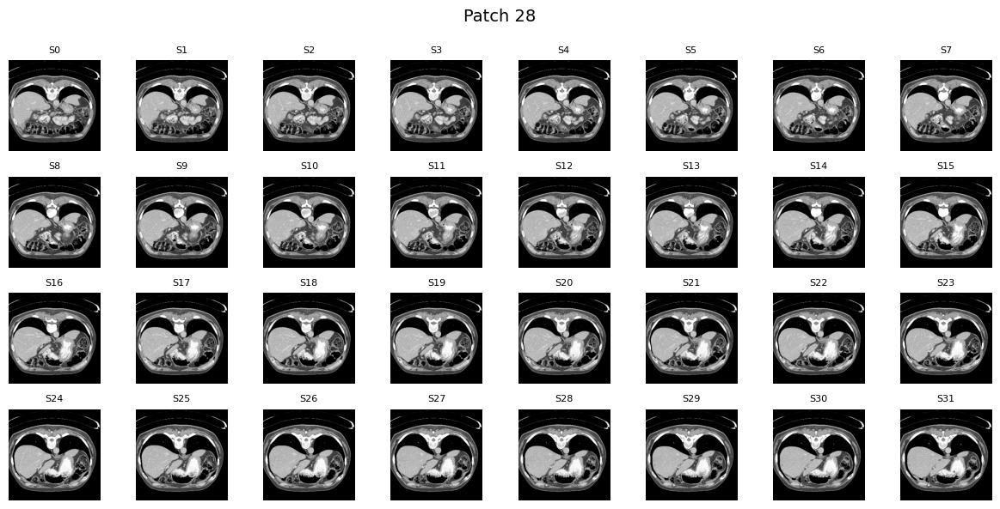

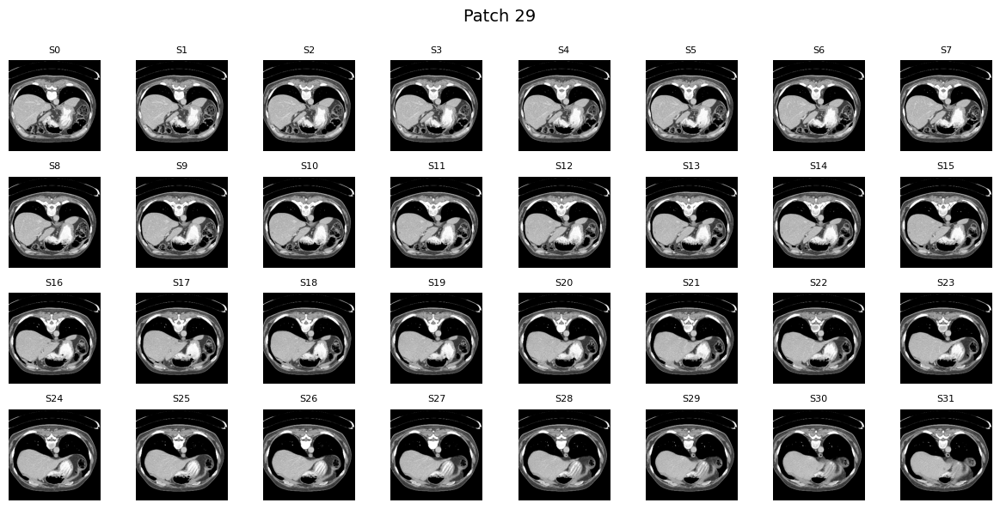

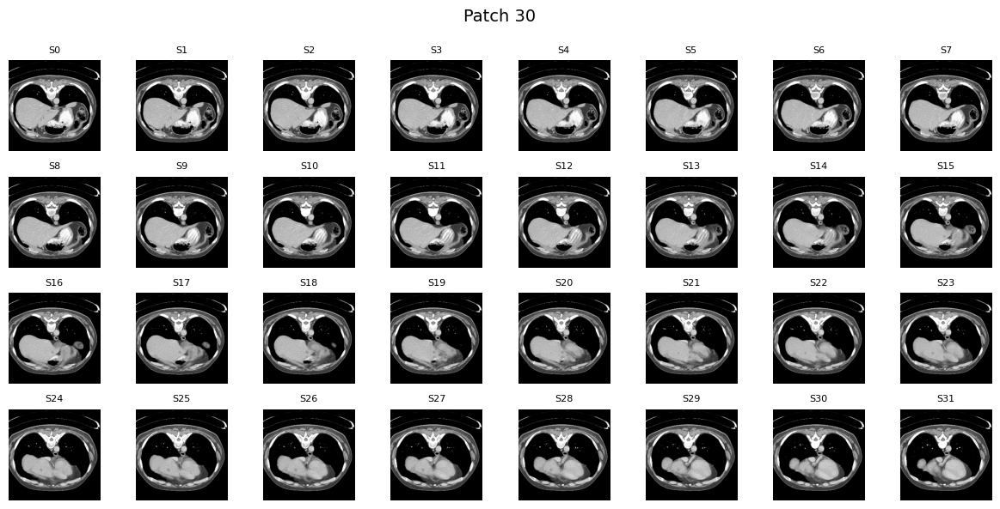

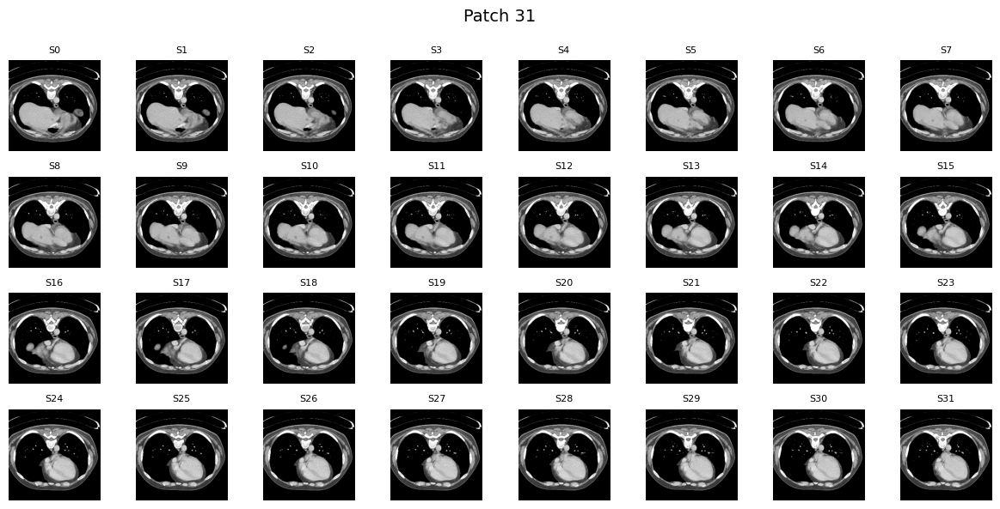

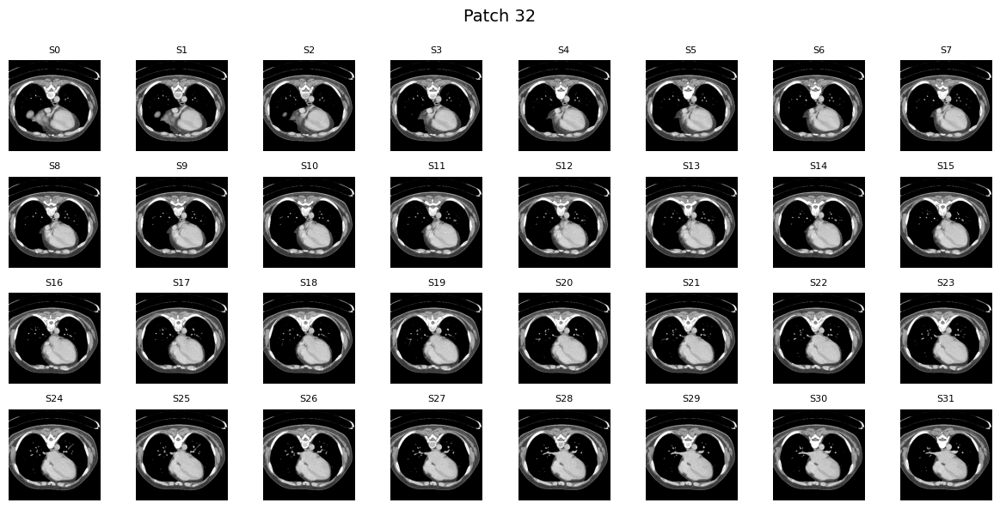

In [11]:
import matplotlib.pyplot as plt
import math

def display_patches_in_grid(patches, slices_per_row=8):
    for patch_idx, patch in enumerate(patches):
        num_slices = patch.shape[0]
        rows = math.ceil(num_slices / slices_per_row)
        fig, axes = plt.subplots(rows, slices_per_row, figsize=(slices_per_row * 1.5, rows * 1.5))
        fig.suptitle(f'Patch {patch_idx}', fontsize=14)

        for slice_idx in range(num_slices):
            row = slice_idx // slices_per_row
            col = slice_idx % slices_per_row
            ax = axes[row, col] if rows > 1 else axes[col]
            ax.imshow(patch[slice_idx], cmap='gray')
            ax.axis('off')
            ax.set_title(f"S{slice_idx}", fontsize=8)

        # Hide unused subplots
        for i in range(num_slices, rows * slices_per_row):
            row = i // slices_per_row
            col = i % slices_per_row
            ax = axes[row, col] if rows > 1 else axes[col]
            ax.axis('off')

        plt.tight_layout()
        plt.subplots_adjust(top=0.88)
        plt.show()

display_patches_in_grid(patches)
